In [4]:
#! pip install git+https://github.com/monolok/bertinizer.git --upgrade

In [5]:
import pandas as pd
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from sklearn.feature_extraction.text import TfidfVectorizer
import re
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import cosine_similarity
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
#from bertinizer import plot_data, analyze_correlation, find_outliers

In [6]:
df = pd.read_csv('/Users/antoinebertin/Documents/jedha/full_stack/projects_full_stack/north_face/sample-data.csv')
df.head()

,id,description
0,1,Active classic boxers - There's a reason why o...
1,2,Active sport boxer briefs - Skinning up Glory ...
2,3,Active sport briefs - These superbreathable no...
3,4,"Alpine guide pants - Skin in, climb ice, switc..."
4,5,"Alpine wind jkt - On high ridges, steep ice an..."


# preprocessings corpus: stop words, lemmatize and clean text with regex

In [7]:
# Load spaCy model
nlp = spacy.load("en_core_web_sm")

In [8]:
# Function to preprocess text
def preprocess_text(doc):
    # Lemmatize and remove stop words
    return " ".join([token.lemma_ for token in nlp(doc) if token.text.lower() not in STOP_WORDS])

# Function to clean text data and remove short words
def clean_text(text):
    # Keep only alphabetic characters, effectively removing all non-alphabetic chars
    text = re.sub(r'[^a-zA-Z]', ' ', text)
    
    # Remove words that are less than 3 characters long
    text = ' '.join([word for word in text.split() if len(word) > 2])
    
    # Replace multiple spaces with a single space
    text = re.sub(r'\s+', ' ', text)
    
    return text.strip().lower()


In [9]:
# Preprocess descriptions
df['processed_description'] = df['description'].apply(preprocess_text)

In [10]:
# Example usage with your DataFrame
df['cleaned_description'] = df['processed_description'].apply(clean_text)

In [11]:
df.drop(['description', 'processed_description'], axis=1, inplace=True)

In [12]:
df

,id,cleaned_description
0,1,active classic boxer reason boxer cult favorit...
1,2,active sport boxer brief skin glory require mo...
2,3,active sport brief superbreathable fly brief m...
3,4,alpine guide pant skin climb ice switch rock t...
4,5,alpine wind jkt high ridge steep ice alpine ja...
...,...,...
495,496,cap bottom cut loose madden crowd search undon...
496,497,cap crew crew take edge fickle weather clearin...
497,498,time shell need use morning times umbrella tim...
498,499,wear cargo short wear cargo shorts bask glory ...


# TF-IDF Transformation

In [13]:
df.head()

,id,cleaned_description
0,1,active classic boxer reason boxer cult favorit...
1,2,active sport boxer brief skin glory require mo...
2,3,active sport brief superbreathable fly brief m...
3,4,alpine guide pant skin climb ice switch rock t...
4,5,alpine wind jkt high ridge steep ice alpine ja...


In [14]:
#Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer() #TfidfVectorizer(stop_words='english')

#Fit and transform the processed descriptions
tfidf_matrix = tfidf_vectorizer.fit_transform(df['cleaned_description'])

In [15]:
feature_names = tfidf_vectorizer.get_feature_names_out()
word_index = 0  # First row
indexes_of_first_row = tfidf_matrix[word_index].indices  # Indexes of words located in the first row
scores_of_first_row = tfidf_matrix[word_index].data  # TF-IDF scores of words in the first row

# Get list of (score, word) tuples
score_word = [(scores_of_first_row[idx], feature_names[word_idx]) 
              for idx, word_idx in enumerate(indexes_of_first_row)]
# Sort list by score in descending order 
score_word.sort(key=lambda x: x[0], reverse=True) 
print(score_word)

[(0.5409000947574236, 'boxer'), (0.26276502667823287, 'expose'), (0.2247693325742051, 'traditional'), (0.17587111738970443, 'classic'), (0.16261010622572866, 'especially'), (0.16261010622572866, 'reason'), (0.1525030870655636, 'situation'), (0.1525030870655636, 'cult'), (0.15243957868938032, 'panel'), (0.15243957868938032, 'brush'), (0.15166663370719474, 'construction'), (0.13976974882347531, 'underwear'), (0.1354430407490441, 'waistband'), (0.1327475760573213, 'quick'), (0.1306914515534376, 'size'), (0.12823509500687064, 'inseam'), (0.1224916854472676, 'take'), (0.12011589084946438, 'functional'), (0.11794696031314819, 'sticky'), (0.11410444996290876, 'favorite'), (0.11077591609710558, 'ultralight'), (0.11077591609710558, 'space'), (0.10649220880712171, 'minimal'), (0.10399743080274368, 'silky'), (0.10286438381257262, 'recycle'), (0.09867367425585072, 'mexico'), (0.09773292199281804, 'active'), (0.09682638658670105, 'travel'), (0.09613532480102219, 'dry'), (0.08987890419520086, 'gladi

In [49]:
tfidf_vectorizer.vocabulary_

{'active': 25,
 'classic': 535,
 'boxer': 349,
 'reason': 2496,
 'cult': 757,
 'favorite': 1140,
 'cool': 682,
 'especially': 1063,
 'sticky': 3035,
 'situation': 2850,
 'quick': 2456,
 'dry': 948,
 'lightweight': 1805,
 'underwear': 3444,
 'take': 3201,
 'minimal': 1982,
 'space': 2957,
 'travel': 3362,
 'pack': 2197,
 'expose': 1097,
 'brush': 382,
 'waistband': 3558,
 'offer': 2135,
 'skin': 2862,
 'softness': 2936,
 'panel': 2218,
 'construction': 657,
 'traditional': 3345,
 'fit': 1190,
 'functional': 1307,
 'fly': 1239,
 'recycle': 2505,
 'polyester': 2351,
 'moisture': 2006,
 'wicke': 3638,
 'performance': 2277,
 'inseam': 1630,
 'size': 2851,
 'recyclable': 2504,
 'common': 609,
 'threads': 3272,
 'recycling': 2507,
 'program': 2408,
 'details': 852,
 'silky': 2829,
 'capilene': 442,
 'fabric': 1114,
 'ultralight': 3423,
 'breathable': 359,
 'elastic': 995,
 'comfort': 600,
 'back': 184,
 'gladiodor': 1349,
 'natural': 2057,
 'odor': 2133,
 'control': 673,
 'garment': 1321,
 'w

# DBSCAN

In [16]:
# Compute cosine similarity matrix
cosine_sim_matrix = cosine_similarity(tfidf_matrix)

In [17]:
# DBSCAN clustering
#! metric='cosine'

# DBSCAN expects distances, so now that we've inverted our matrix, smaller eps values make more sense
dbscan = DBSCAN(eps=0.14, min_samples=4, metric='cosine')
clusters = dbscan.fit_predict(cosine_sim_matrix)
np.unique(clusters)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21])

In [18]:
# Add cluster labels to the DataFrame
df['cluster'] = clusters
df['cluster'].value_counts()

cluster
-1     124
 1     106
 3      62
 0      39
 5      25
 2      22
 15     16
 9      15
 12     15
 8       8
 11      7
 16      7
 19      7
 10      6
 7       5
 20      5
 18      5
 13      5
 14      5
 6       4
 4       4
 17      4
 21      4
Name: count, dtype: int64

# word clouds for each cluster

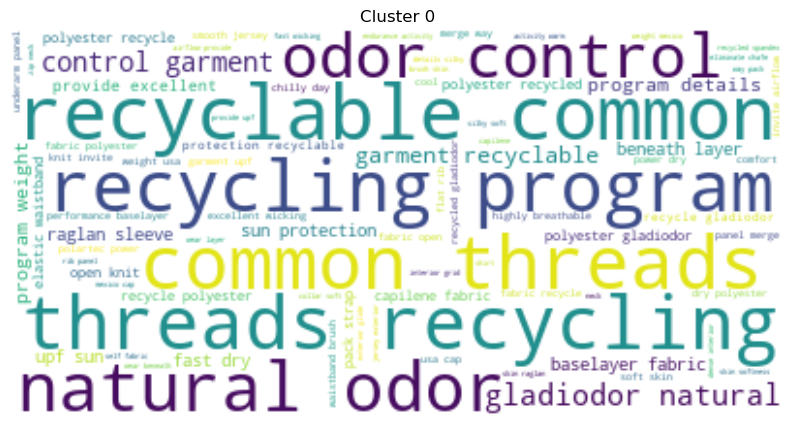

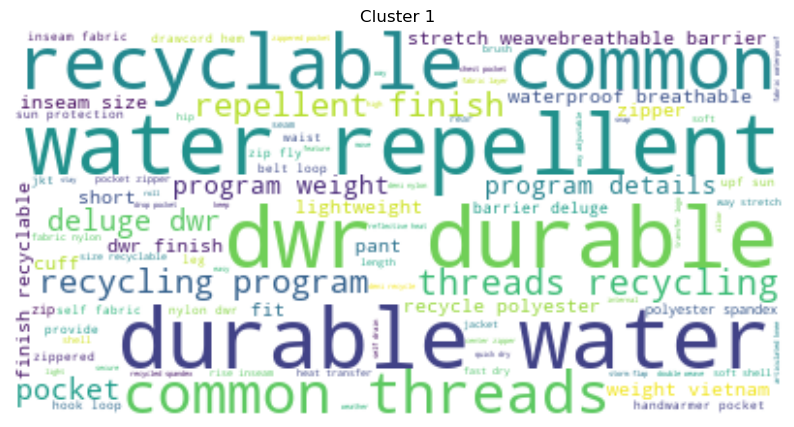

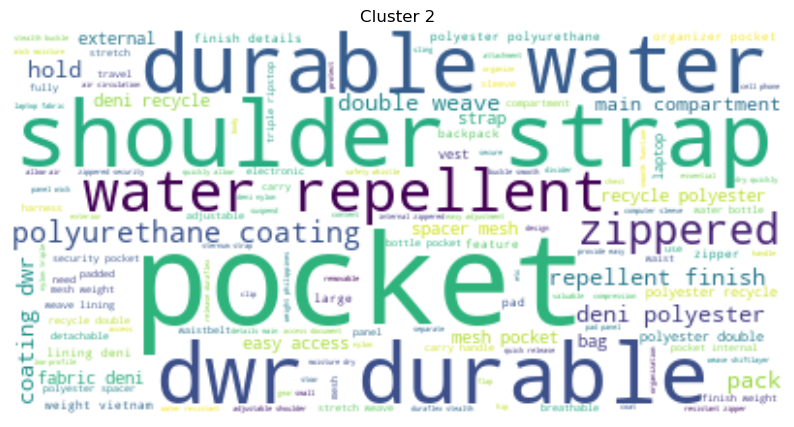

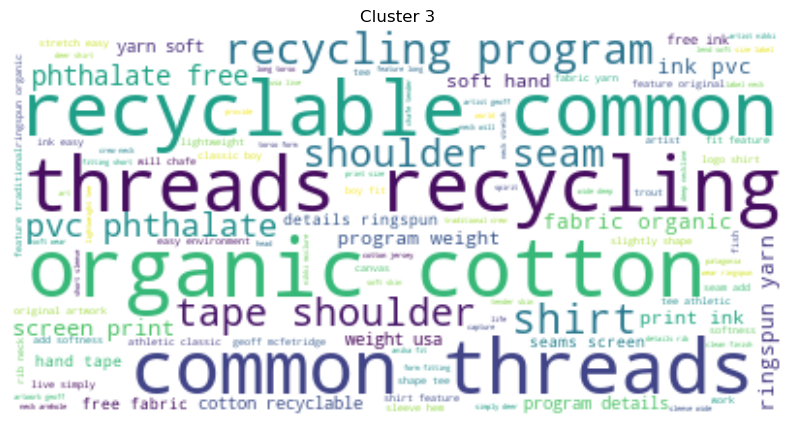

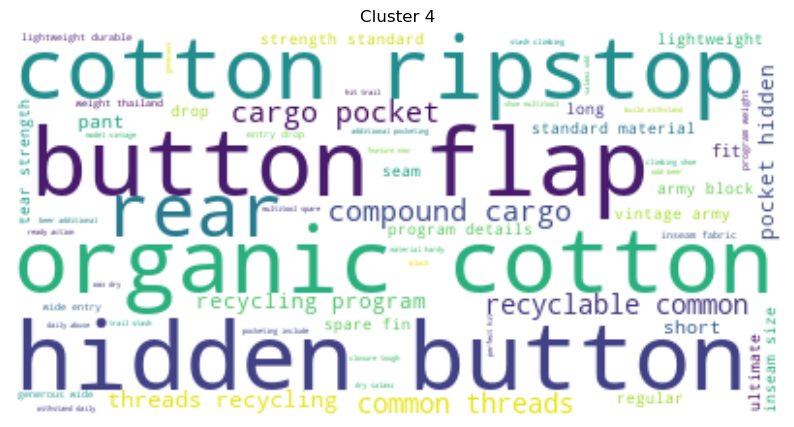

...

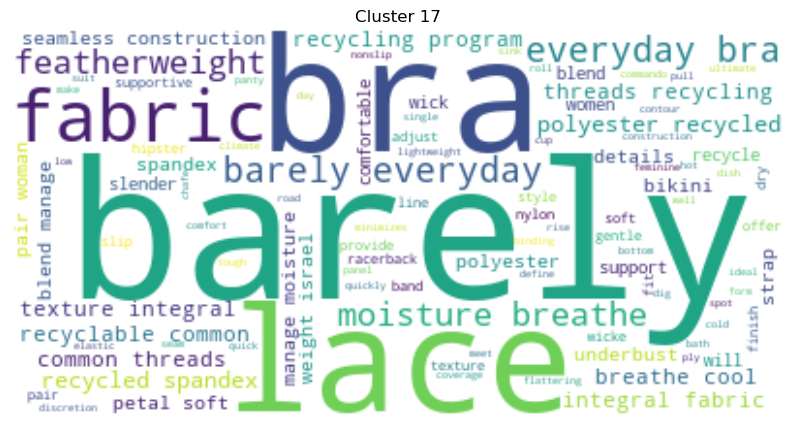

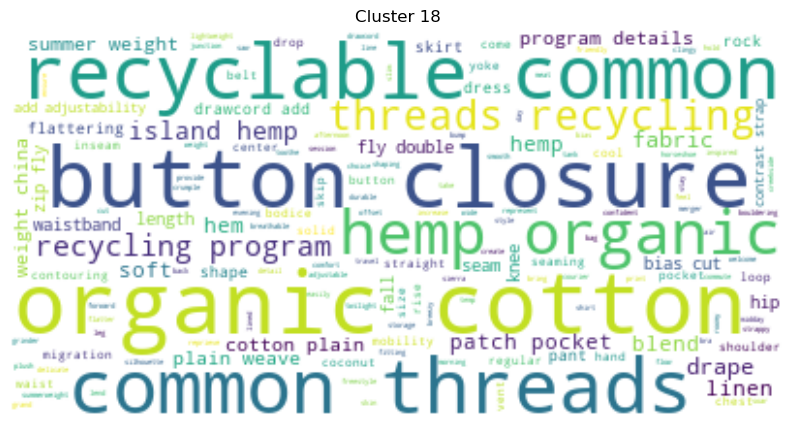

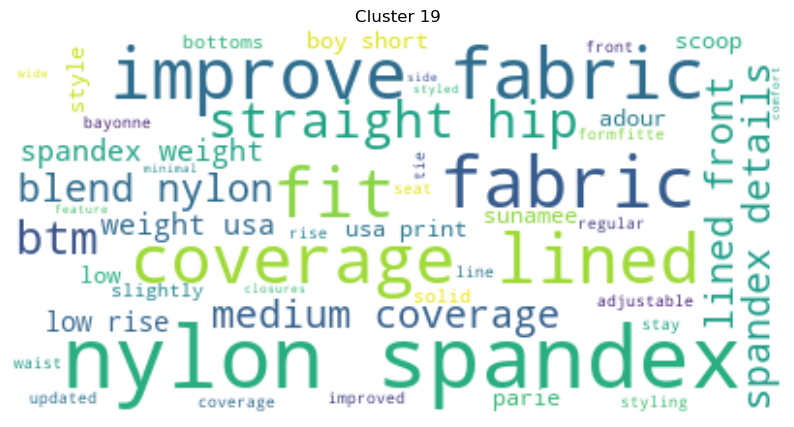

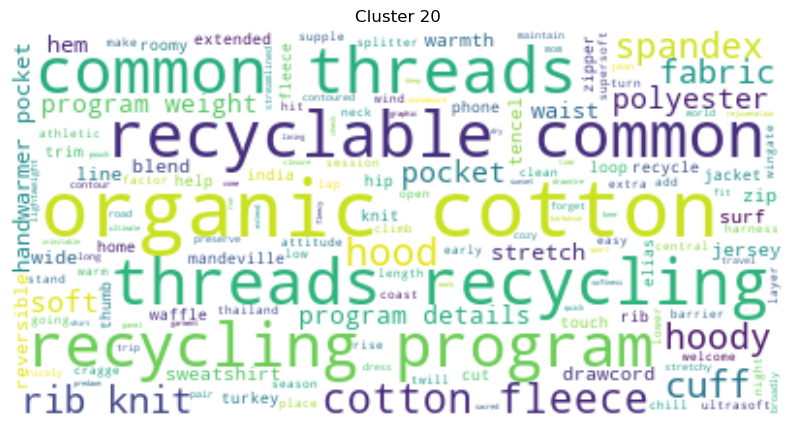

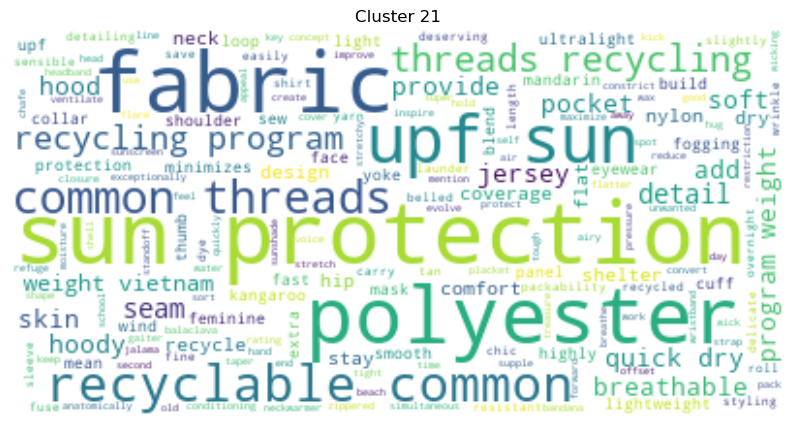

In [19]:
# Generate and display word clouds for each cluster
for cluster in set(clusters):
    if cluster == -1:
        continue  # Skip outliers
    cluster_texts = df[df['cluster'] == cluster]['cleaned_description'].values
    text = " ".join(cluster_texts)
    wordcloud = WordCloud(background_color='white').generate(text)
    plt.figure(figsize=(10, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Cluster {cluster}")
    plt.show()


# Save DF

In [20]:
df.head()

,id,cleaned_description,cluster
0,1,active classic boxer reason boxer cult favorit...,0
1,2,active sport boxer brief skin glory require mo...,-1
2,3,active sport brief superbreathable fly brief m...,-1
3,4,alpine guide pant skin climb ice switch rock t...,1
4,5,alpine wind jkt high ridge steep ice alpine ja...,1


In [21]:
#df.to_csv('/Users/antoinebertin/Documents/jedha/full_stack/projects_full_stack/north_face/df.csv', index=False)

# TruncatedSVD

In [26]:
# how many clusters i have identified
len(np.unique(clusters))

23

In [23]:
from sklearn.decomposition import TruncatedSVD

In [29]:
n_components = 15
lsa_model = TruncatedSVD(n_components=n_components, random_state=42)
# I create the document-topic matrix.
#Rows: documents | Columns: topics which is n_components
topic_encoded_df = lsa_model.fit_transform(tfidf_matrix)

In [31]:
# Create a DataFrame for the encoded topics
topic_encoded_df = pd.DataFrame(topic_encoded_df, columns=["topic_" + str(i) for i in range(n_components)])

In [37]:
# Find the main topic for each document
main_topic = np.argmax(topic_encoded_df.values, axis=1)
topic_encoded_df['main_topic'] = main_topic

In [57]:
lsa_model.components_[0].argsort()[:-11:-1] #top 10 contributing features (words) for the first topic

array([2340, 2159,  698, 2504, 2351,  609, 3272, 2408, 2507, 1114])

In [58]:
# Extract and interpret topics + word clouds
feature_names = tfidf_vectorizer.get_feature_names_out()

In [60]:
feature_names[2340] # top 1 work for the first topic

'pocket'

Topic 0:
pocket organic cotton recyclable polyester common threads program recycling fabric


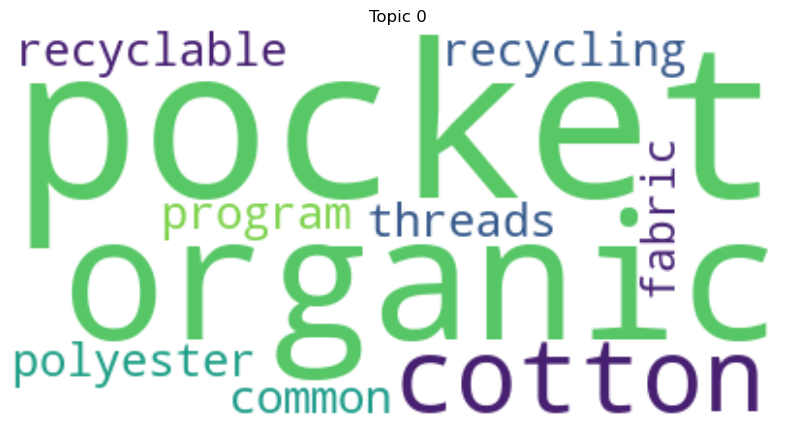

Topic 1:
organic cotton shirt ringspun print phthalate pvc ink tape screen


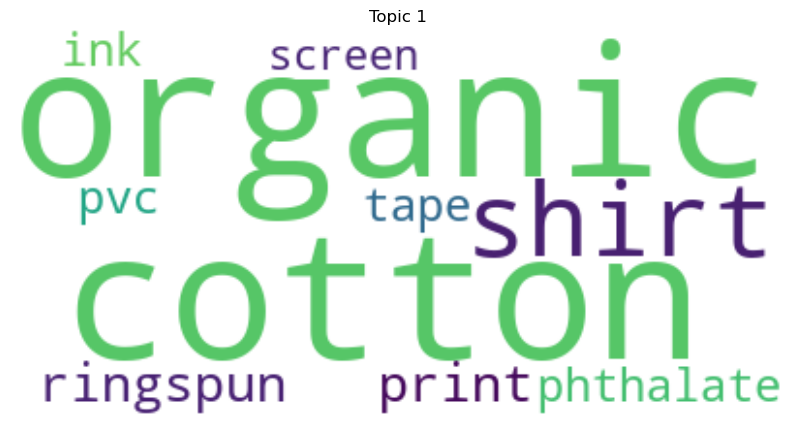

Topic 2:
merino odor wool control gladiodor natural capilene skin wash knit


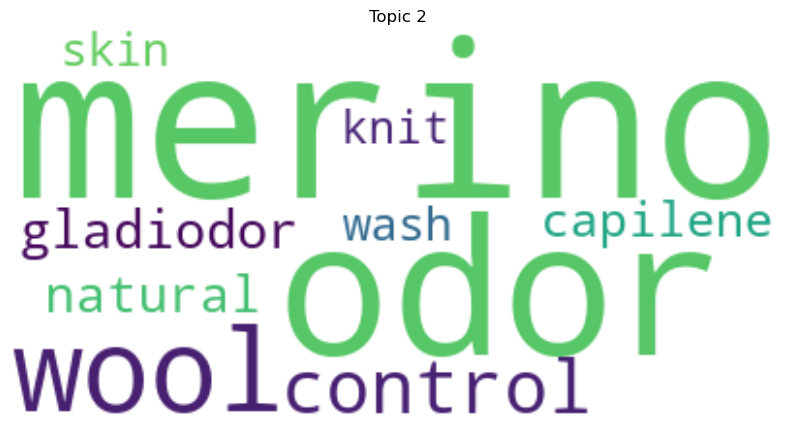

Topic 3:
inseam organic cotton button canvas short jean fly closure size


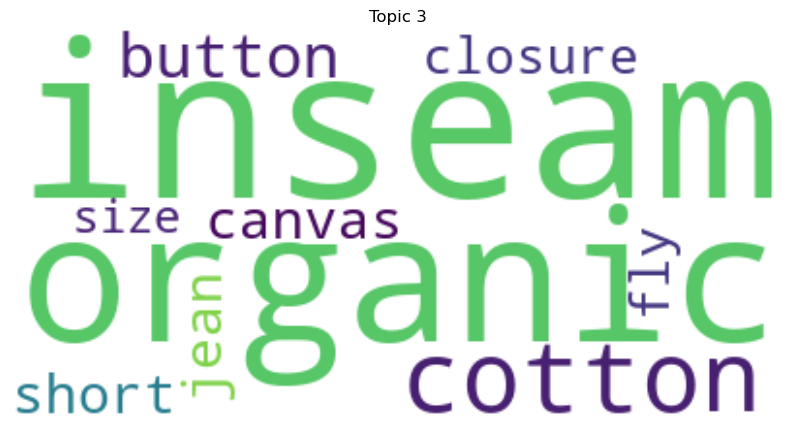

Topic 4:
merino wool wash machine slow lie naturally resist core chlorine


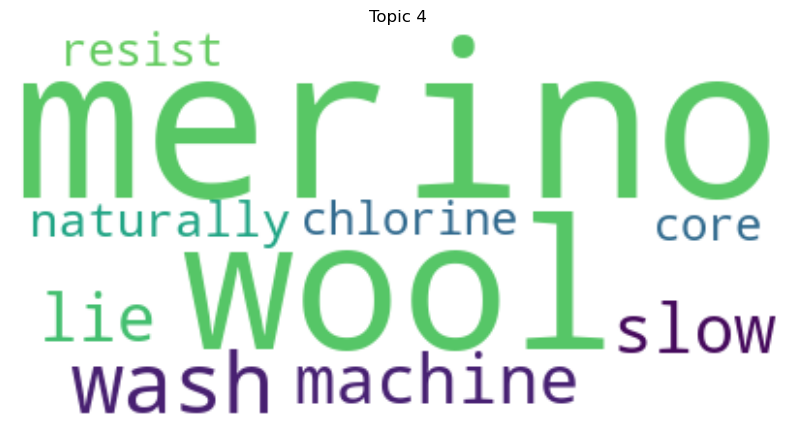

Topic 5:
nylon spandex sun coverage upf protection lined rise blend print


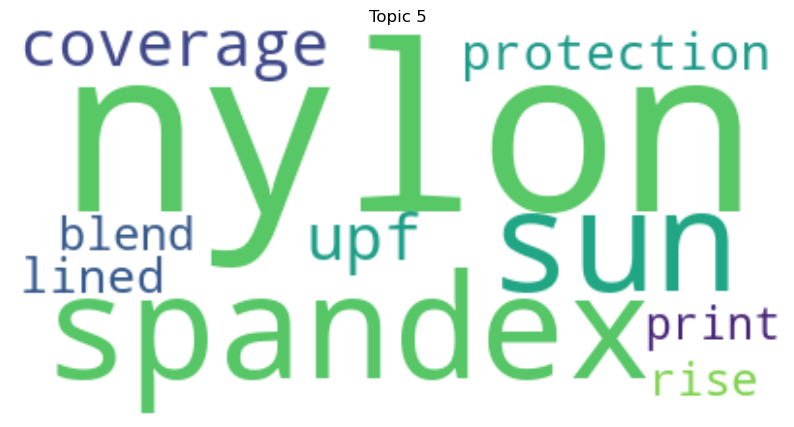

Topic 6:
spandex coverage tencel lined blend cotton organic bra fleece jersey


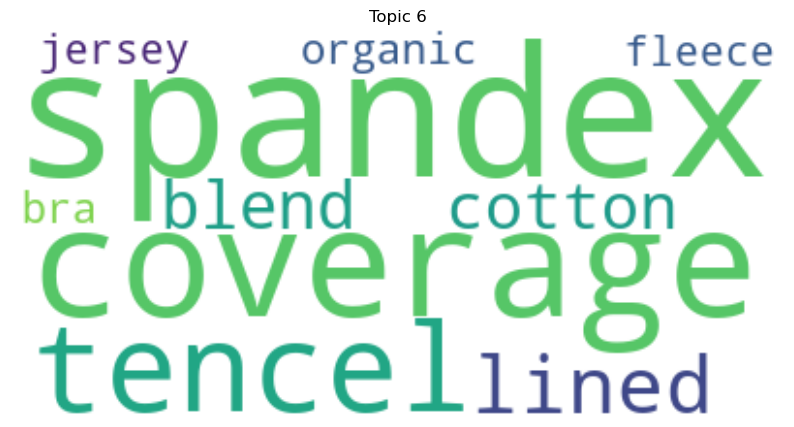

Topic 7:
strap mesh polyurethane deni compartment coating shoulder pocket access polyester


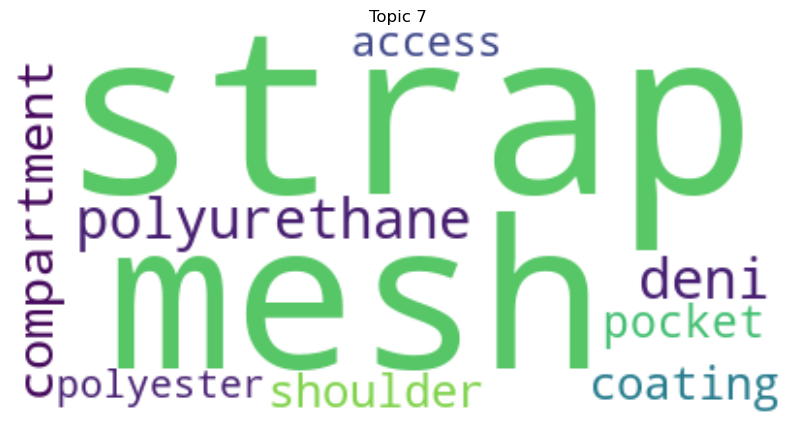

Topic 8:
gladiodor brush waistband natural control garment capilene smooth excellent recycled


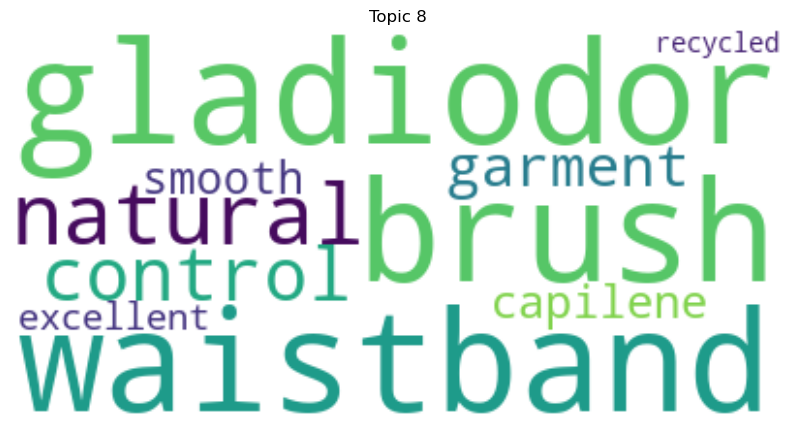

Topic 9:
waterproof barrier organic cotton breathable layer hydrostorm proprietary sun adjustable


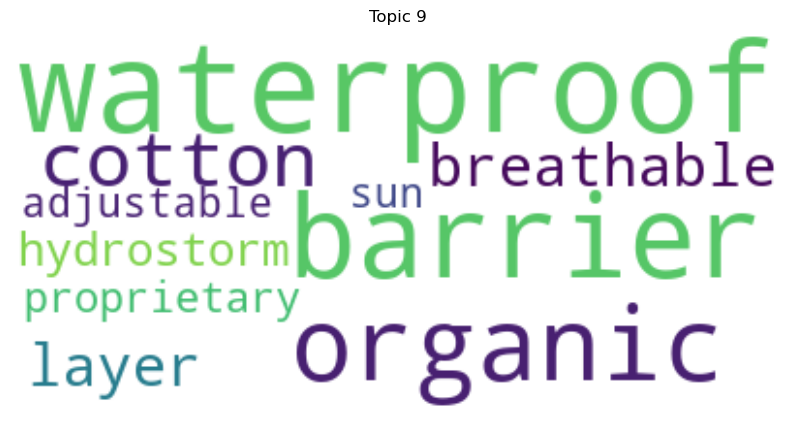

Topic 10:
photo poster outside human photograph catalog soy outdoor specialty dimension


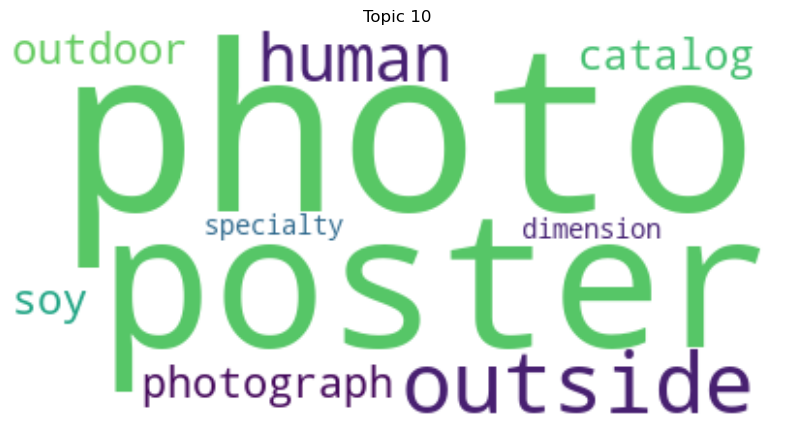

Topic 11:
reflective logo heat deni dwr transfer weave neck deluge finish


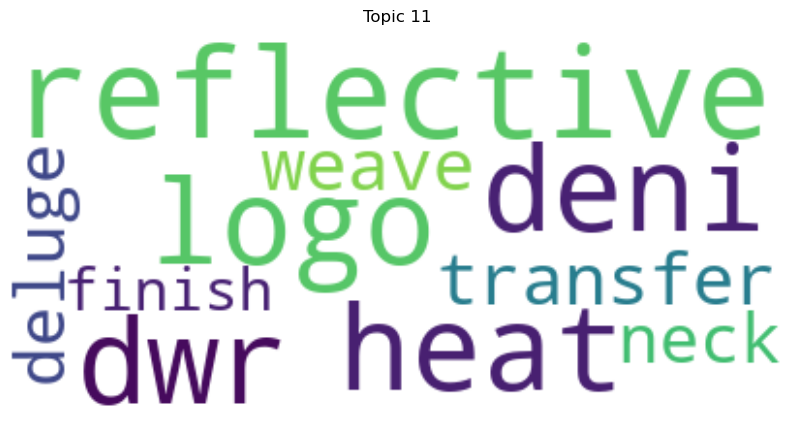

Topic 12:
coverage lined fleece waterproof hood canvas entry improve nylon pocket


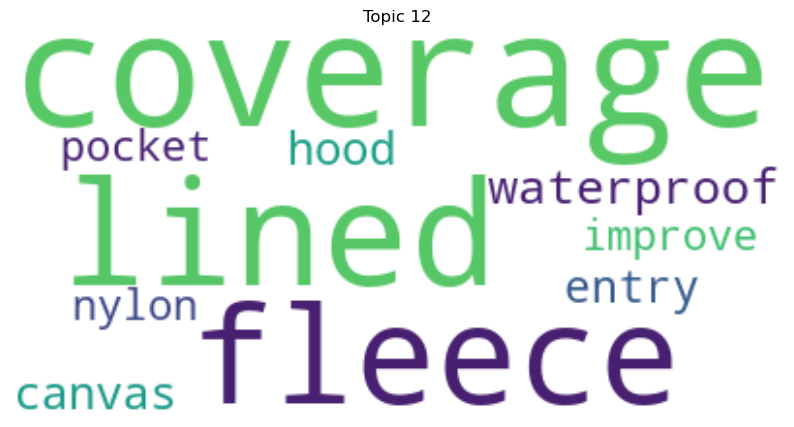

Topic 13:
heat logo reflective construction transfer foot toe denim jean underarm


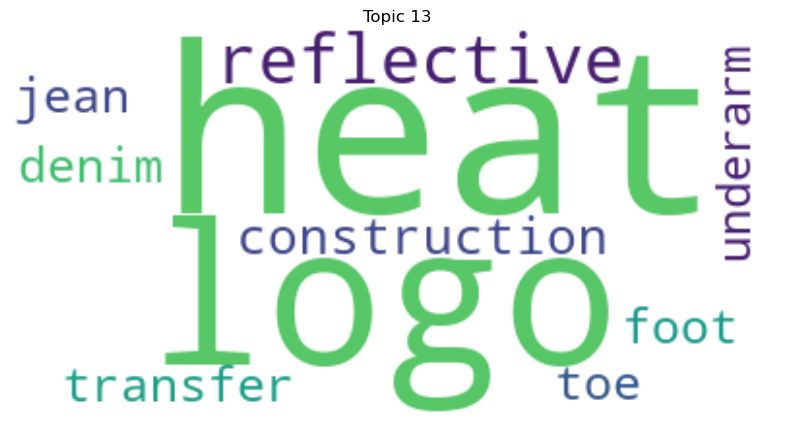

Topic 14:
jean coverage denim lined microfiber hydrostorm proprietary wash fleece gravel


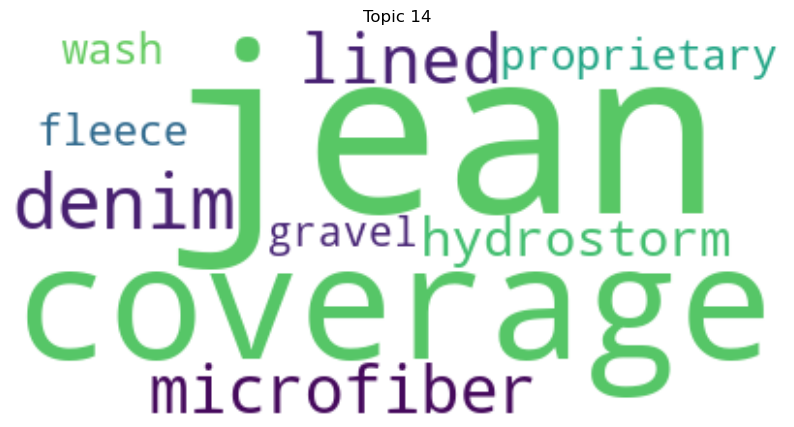

In [48]:
for topic_idx, topic in enumerate(lsa_model.components_):
    top_features_ind = topic.argsort()[:-11:-1]
    top_features = [feature_names[i] for i in top_features_ind]
    weights = topic[top_features_ind]

    print(f"Topic {topic_idx}:")
    print(" ".join(top_features))
    
    # Generate word clouds for each topic
    wordcloud = WordCloud(stopwords=None, background_color='white', max_words=100, max_font_size=120, random_state=42)
    word_freq = {word: weights[i] for i, word in enumerate(top_features)}
    wordcloud.generate_from_frequencies(word_freq)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Topic {topic_idx}')
    plt.show()
